In [ ]:
# MIT License
#
#@title Copyright (c) 2026 CCAI Community Authors { display-mode: "form" }
#
# Permission is hereby granted, free of charge, to any person obtaining a
# copy of this software and associated documentation files (the "Software"),
# to deal in the Software without restriction, including without limitation
# the rights to use, copy, modify, merge, publish, distribute, sublicense,
# and/or sell copies of the Software, and to permit persons to whom the
# Software is furnished to do so, subject to the following conditions:
#
# The above copyright notice and this permission notice shall be included in
# all copies or substantial portions of the Software.
#
# THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
# IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
# FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL
# THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
# LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING
# FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER
# DEALINGS IN THE SOFTWARE.

# CCAI Summer School Tutorial | Estimating Coal Power Plant Operation From Satellite Images with Computer Vision
Original Author:
*   André Ferreira, TransitionZero, andre@transitionzero.org

Updated by:
*   [2024] Isabelle Tingzon, issa@climatechange.ai
*   [2026] El Khalil Cherif, el.k.cherif@tecnico.ulisboa.pt

This tutorial addresses the application of AI for Monitoring, Reporting, and Verification, in particular for coal power emissions. In the end, you should have learned more about:
- The gaps in emissions data
- Practical usage of freely available satellite imagery
- The application of computer vision models for the purpose of emissions monitoring
- How satellite-based activity signals connect to carbon accounting and MRV, and the limitations and responsible-use considerations involved

# Table of Contents


*   [Overview](#overview)
*   [Climate Impact](#climate-impact)
*   [Prerequisites](#prereq)
*   [Background on coal power plants](#background)
*   [Software Requirements](#software-requirements)
*   [Data Description](#data-description)
*   [Methodology](#methodology)
*   [Results & Discussion](#results-and-discussion)
*   [References](#references)


<a name="overview"></a>
# Overview

Over the next sections of this notebook, we'll go through the steps of how to monitor coal power plants, leveraging satellite imagery and computer vision models. In the pursuit of this goal, some of the main contributions of this tutorial are:
- A [dataset of coal power plants' emissions](https://drive.google.com/drive/folders/1_Jsl__ZcmOOYhErA9wH5QM8SPRIEgbfj?usp=share_link), including images, metadata and labels.
- A [public GitHub repository](https://github.com/AndreCNF/ccai-ss23-ai-monitoring-tutorial) with auxiliary code for creating the dataset, fetching Sentinel 2 images and training computer vision models.

<a name="climate-impact"></a>
# Climate Impact

## Data gaps

In a (data scientist's) utopian world, for every region of the world, every domain and every point in time, there would be perfectly formatted, reliable and easily accessible data. Unfortunately, that is not the case. Particularly in greenhouse gas emissions data, the quality and availability of data varies greatly, both geographically and along time. For instance, the USA has [CAMPD](https://campd.epa.gov/), where power generation and emissions are made publicly available for each power plant, on an hourly basis. Similarly, the EU has [ENTSOE](https://transparency.entsoe.eu/generation/r2/actualGenerationPerGenerationUnit/show) and Australia has [NEM](https://github.com/opennem/opennempy). But for most other areas of the world, data of this granularity is unavailable, difficult to access, or relies on self-reporting by energy companies. Outside the power sector, for example, in heavy industry or Scope 3 emissions from supply chains, these challenges are even greater.


While ground-level sensors are hard to implement globally and self-reported data can be unreliable, satellites are a naturally global sensor. For domains where emissions  or emissions-related activity can be observed from space, we can generate activity estimates and, in some cases, support emissions-estimation workflows at a global scale, training machine learning models on regions where labelled data is available, and applying them more broadly.

## Transparency

Because satellite observations don't depend on any single reporting party, they can also improve transparency, providing an additional line of evidence that helps validate reported activity and identify discrepancies, without replacing ground-based measurement.

This is closely related to the concept of MRV (Monitoring, Reporting, and Verification), which plays an important role in climate policy and carbon accounting. MRV frameworks are designed to answer three key questions:


* **Monitoring**: What activity is taking place?
* **Reporting**: What information is being disclosed?
* **Verification**: Does the reported information align with available evidence?

Traditionally, MRV relies heavily on operator-reported information and ground-based measurements. Satellite-based approaches can complement these by giving regulators, researchers, NGOs, journalists, and other stakeholders an independent way to check whether reported activity matches what's observed;  In this way, remote sensing can contribute not only to emissions estimation, but also to greater transparency and accountability in climate commitments.


## Climate action from data

When faced with a challenge, it's important to have a thorough understanding of its context and our progress towards resolving it. Thus, emissions and climate data can guide us towards comprehending and addressing climate change. Furthermore, as we get a sense for the kinds of solutions that can help us achieve our mitigation and adaptation goals, such as renewable energy penetration, plant-based diets and switching from fossil fueled cars to electric and/or active methods of transport, a key step is spreading the message to bring those ideas into fruition. And while the best communication approach can vary from culture and target audience, data can help to construct a solid, fact-based narrative for climate action.


At TransitionZero, where I currently work, we have examples of using this approach of data for climate action, such as:
*   [Turning the Supertanker](https://www.transitionzero.org/insights/turning-the-supertanker) - a report on the unprofitability of coal power plants in China and how much the country could save by switching to renewable energy
*   [Japan’s toxic narrative on ammonia](https://www.transitionzero.org/insights/japans-toxic-narrative-on-ammonia-cofiring) - an analysis on the misleading emissions saving potential of co-firing ammonia with coal
*   [Two billion reasons: how Indonesia can get ahead of the net zero curve](https://www.transitionzero.org/insights/indonesia-net-zero-curve) - exploring potential pathways for Indonesia's emission cuts derived from energy systems modelling



## From Prediction to Climate Action

The examples above show organisations using data to make the case for climate action at a policy or investment level. This tutorial works one level down: it builds the kind of activity signal that data like this depends on. So it's worth asking a more specific question here: once our model tells us whether a cooling tower appears active on a given day, how does that turn into the kind of climate action we've been describing?

The answer is that the prediction itself is usually not the final goal. Instead, it acts as a piece of information that can be combined with other data sources to better understand how a power plant is operating.

Let's trace that chain step by step. Satellite imagery provides observations of a facility, and a computer vision model turns those observations into signals about plant activity. By repeating this process over time, we can build a picture of how often a coal power plant is operating and how its activity changes.

This is also a good moment to clarify what the model in this tutorial is actually predicting. We are not directly estimating greenhouse gas emissions from satellite imagery. Instead, we are predicting an operational signal: whether a cooling tower appears to be operating in a given image. In other words, the model estimates activity, not emissions.

However, activity estimates can be a useful input into emissions-estimation workflows. Once we have information about how frequently a plant appears to operate, we can combine it with other data, such as plant capacity, fuel type and emissions factors, to estimate greenhouse gas emissions.

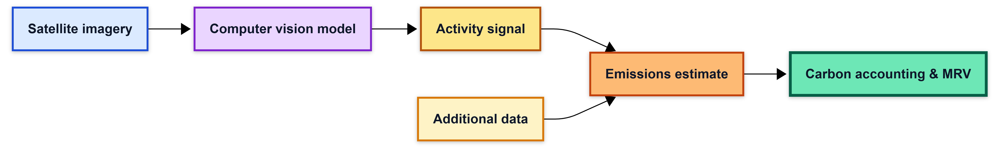

Organisations such as Climate TRACE use similar approaches, combining activity data from multiple sources with emissions-estimation methodologies to produce emissions inventories. For a real-world example of how activity data can be translated into emissions estimates, see [ The Climate TRACE Power Sector: Electricity Generation Methodology](https://github.com/climatetracecoalition/methodology-documents/blob/main/2025/Power/Emissions%20from%20Electricity%20Generation-PowerSector-030226.docx.pdf)  



The resulting estimates can support carbon accounting and MRV processes by translating activity observations into information that can be used within broader climate-monitoring systems.

Of course, each step in this workflow introduces uncertainty, and activity estimates derived from satellite imagery have important limitations. We discuss some of these limitations later in the tutorial.

In this tutorial, we focus on one part of that broader workflow: using satellite imagery and computer vision to generate an activity signal from coal power plants. While this is only one piece of the puzzle, it illustrates how machine learning can contribute to larger climate-monitoring systems and, ultimately, support more informed climate action.


<a name="prereq"></a>
# Prerequisites

## Hardware settings

In the methodology section, there are code cells that train deep learning models. In order to get these cells to run in a reasonably short amount of time (10-15 minutes each), you should make sure that you add a GPU to your Colab notebook. You can do so by clicking on `Runtime` ➡️ `Change runtime type` ➡️ `Hardware accelerator` ➡️ `GPU`

## Power sector knowledge

You don't need to be an expert in power plants to go through this tutorial. The section bellow has some further context on coal power plants if you're interested, but it's enough to just be aware that coal power plants can be generating power (`ON`) or idle (`OFF`), producing visible plumes when `ON`.

## Machine learning knowledge

You may benefit from some knowledge of Python, PyTorch and deep learning in general, as all of these are utilised. This knowledge is particularly relevant if you want to experiment with using different models or different data approaches. You can still run all of the code and analyse the results without having to edit anything.

<a name="background"></a>
# Background on coal power plants

## Operation status

We can think of a coal power plant as having two main operational statuses: idle (`OFF`) or generating electricity (`ON`). Within the `ON` state, the power plant can generate different levels of energy, and cause more or less emissions in a proportional manner, which depend on its capacity (i.e. how much power can it generate at its maximum) and its capacity factor (i.e. what percentage of its capacity is it generating). But for the purposes of this tutorial, we only care about whether the power plant is `ON` or `OFF`.

In this tutorial, we are interested in estimating this operational status because it provides an observable link between satellite imagery and electricity generation. When a coal power plant is generating electricity, its cooling system is often active, producing visible water-vapor plumes that can frequently be observed in Sentinel-2 imagery under suitable imaging conditions. These visual signals form the basis of the computer vision task developed later in this tutorial. Rather than explicitly detecting water-vapor plumes, the model learns visual patterns associated with operating and non-operating cooling towers.

Coal power plants tend to be used as baseload, i.e. being in a somewhat constant state of either `ON` or `OFF`, as can be seen later on in one of the data analysis plots, and are typically slow to ramp up and down. Thus, a snapshot of them every few days, such as from satellite images, should be enough to get a realistic picture of their operational status and emissions.  However, satellite observations cannot capture short-term operational changes that occur between satellite overpasses.


## Brief description of how a coal power plant works

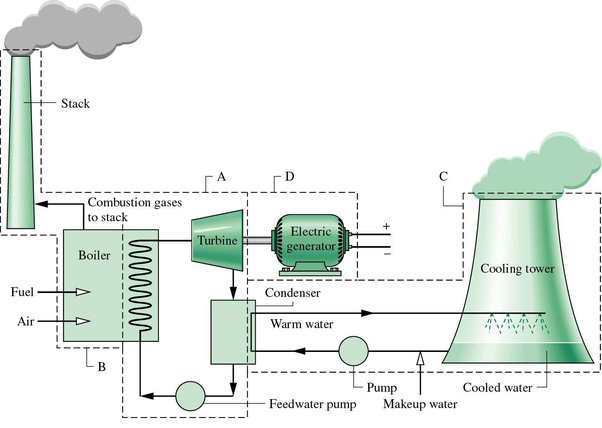

As a thermal energy source, coal power plants produce energy by heating up water and using its steam to turn a turbine. In the case of a coal power plant, it burns coal to produce the heat that steams up the water.

From an emissions standpoint, the main types of infrastructure in a coal power plant that we should care about are:
*   Flue stacks: a narrow and tall chimney where the waste gases from coal burning (including CO2) are vented out
*   Cooling technology: what's used to cool down the water that is heated up inside the power plant; some of the main cooling types are:
    *   Cooling towers: a wide and voluminous tower where the water cools down at a pool on the bottom of it while big plumes of water vapor come out
    *   Water outlet: in the once-through cooling method, the water that is pulled in to spin the turbine is then pushed straight out of the power plant (e.g. back to a river)

Although all of these components are related to plant operation, they are not equally useful for satellite-based monitoring. Some produce strong and easily observable visual signals, while others are more difficult to distinguish or cannot be reliably resolved using publicly available satellite imagery. This motivates the choice of the visual signal used throughout this tutorial.




## Signals

Depending on the technology in use, coal power plants can have a set of signals that relate to their operational status and CO2 emissions:
*   Cooling tower plumes → Generally the most easily visible signal in Sentinel-2 optical imagery. Large water-vapor plumes are often associated with active cooling systems and can therefore provide a useful indicator of plant operation. We'll focus on this signal throughout the tutorial because it is the clearest and most consistently observable using publicly available satellite imagery.
*   Flue stack plumes → Can be harder to spot, especially in medium- to low-resolution images. Flue stack plumes are generally smaller and less consistent than cooling tower plumes, making them more difficult to distinguish from background haze or clouds.

    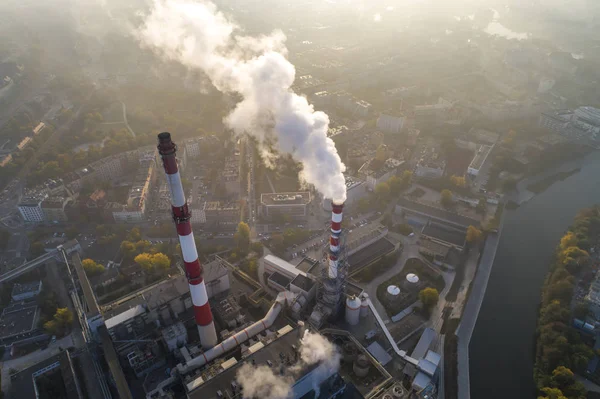
*   Flue stack and cooling tower heat → Thermal data from satellites is still too low in spatial resolution to accurately resolve heat signatures at the scale of individual cooling towers or flue stacks, limiting its usefulness for this task.

    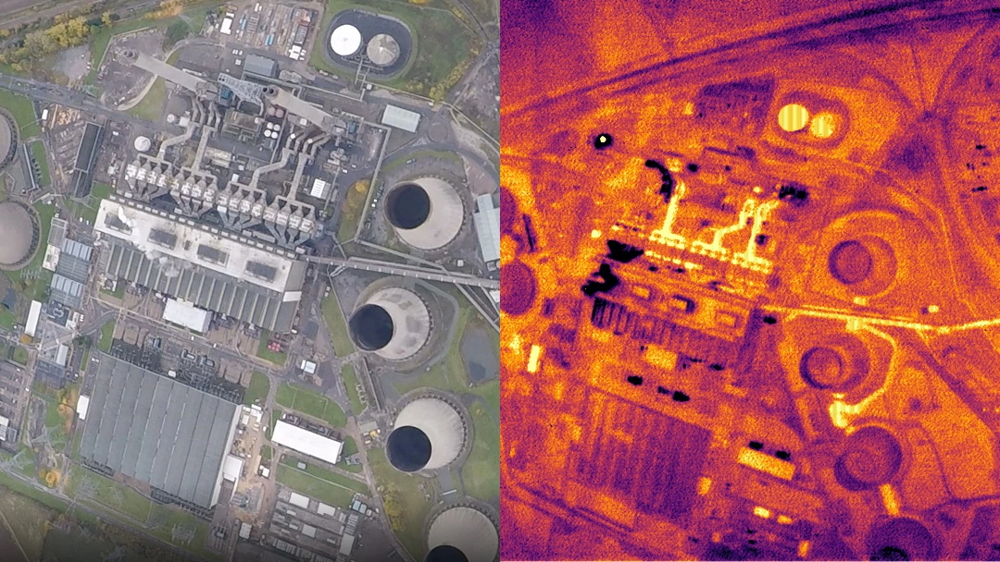
*   Cooling water flow → Hard to decouple from nearby industrial activity or natural variation in surrounding water bodies, making it a less reliable signal for estimating plant operation from satellite imagery.

    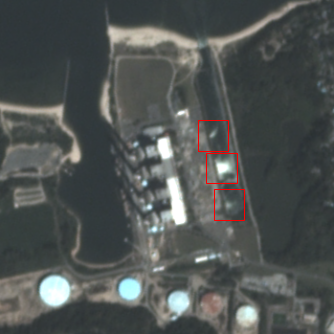


<a name="software-requirements"></a>
# Software Requirements

The main software dependency here is [coal_emissions_monitoring](https://github.com/AndreCNF/ccai-ss23-ai-monitoring-tutorial/), a Python library that was designed for this tutorial. It includes a lot of helper functions and notebooks to replicate this work, from dataset creation to machine learning model definition.

In [ ]:
!python --version

In [ ]:
%%capture
!pip install git+https://github.com/AndreCNF/ccai-ss23-ai-monitoring-tutorial.git
!pip install gdown
!pip install aim
!pip install codecarbon

In [12]:
# Data visualization
import plotly.express as px
from ipywidgets import interact
from coal_emissions_monitoring.data_viz import view_satellite_image

# Data processing
import pandas as pd
import geopandas as gpd
from coal_emissions_monitoring.dataset import CoalEmissionsDataModule

# Model training
import torch
import timm
import lightning as L
from lightning import Trainer
from lightning.pytorch.callbacks import EarlyStopping, ModelCheckpoint
from coal_emissions_monitoring.model import CoalEmissionsModel, SmallCNN
from codecarbon import EmissionsTracker

# Others
import os
from loguru import logger
logger.disable("coal_emissions_monitoring")

We also install `Aim`, an experiment tracking framework used to record training metrics, model parameters, and other metadata during model development. Tracking experiments helps improve reproducibility and makes it easier to compare different model configurations.

In [13]:
# Experiment tracking
%load_ext aim
from aim.pytorch_lightning import AimLogger

The aim extension is already loaded. To reload it, use:
  %reload_ext aim


Finally, we set a random seed to improve the reproducibility of our experiments. While some GPU operations remain nondeterministic, fixing the random seed helps ensure that results are more consistent across different runs of the tutorial.

In [14]:
# set the random seed for reproducibility
L.seed_everything(42)

Seed set to 42


42

<a name="data-description"></a>
# Data Description

The data in this tutorial has been assembled using a combination of the following sources:
*   [AWS' Sentinel 2 L2A collection](https://registry.opendata.aws/sentinel-2-l2a-cogs/): satellite images made available both as the typical visible light images and as multispectral images; visual bands have a spatial resolution of 10 metres (i.e. each pixel represents ~10x10 square metres on the ground). In this tutorial, each image is centred on a cooling tower and serves as the input to the computer vision model.

*   [Google's geospatial classification demo](https://github.com/GoogleCloudPlatform/python-docs-samples/blob/main/people-and-planet-ai/geospatial-classification/labeled_geospatial_data.csv): dataset of timestamps and coordinates of cooling towers, with a label on whether or not its associated power plant was operating. These labels provide the ground truth used to train and evaluate the model.

Our goal in the end is to be able to estimate the operation status of coal power plants through the satellite images, which is a proxy for plant activity and can support emissions estimation.

The data has already been collected and processed in the [coal_emissions_monitoring](https://github.com/AndreCNF/ccai-ss23-ai-monitoring-tutorial/) repo, but feel free to check it for more information on how it was done. The main step taken there was downloading satellite images and associating them to each row of the labelled dataset.

In other words, each observation in the final dataset consists of:

* a Sentinel-2 satellite image centred on a cooling tower (model input);
* the corresponding timestamp and location; and
* a binary label indicating whether the associated coal power plant was operating (ON) or idle (OFF) at the time the image was acquired (prediction target).



## Data Download
All of the data required for this tutorial is made available in [this public Google Drive folder](https://drive.google.com/drive/folders/1ywJduPZYqOfPi3Sung93dlZnlmvYTOfK). We're just going to download it to this notebook's disk before preparing the dataset for model training.

In [4]:
!gdown --folder https://drive.google.com/drive/folders/1TrgvYM7SW3Z9KQaohlPsCqehsZgWK8MA

Retrieving folder contents
Retrieving folder 1n123Hp_LVmMUBDvDfC3nftFTUfMidGaO images
Processing file 1JBLJoYlMgHI87GEvcBMZyjmoq_RYylyh .DS_Store
Processing file 1M8M_7prrLPcuNR-sWxDR8EpLuyfKFj41 all_bands_images.tar.gz
Processing file 1h_GsgpDpyrZZlyU_fvLpXokzjQh81CAC visual_images.tar.gz
Processing file 1CGmfnNdIpukYobJaknbOBd1PEXdmC1h2 all_urls_dataset.csv
Processing file 193gcBwi2jUNNpBRk1riKUM6ntHu1Q9Fr final_dataset.csv
Processing file 18-3u46Ve4_Ioofd7YcAHErBDuPAoLw3a image_metadata.csv
Processing file 1ZP224rP-9jNMqkuainpwE2GjwT23UinJ labeled_geospatial_data.csv
Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=1JBLJoYlMgHI87GEvcBMZyjmoq_RYylyh
To: /home/subarna/climate_change_ai/coal-power-mrv/data/images/.DS_Store
100%|█████████████████████████████████████| 6.15k/6.15k [00:00<00:00, 50.6MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1M8M_7prrLPcuNR-

## Data Preprocessing

Here we're going to decompress our satellite images, configure the dataset, and prepare it for model training and evaluation.

Get the images from the compressed file (takes ~2 minutes):

In [15]:
# unpack the images into ./images (skipped if the archive was already unpacked and deleted)
!test -f data/images/visual_images.tar.gz && mkdir -p images && tar -C images --strip-components=8 -xzf data/images/visual_images.tar.gz && rm -f data/images/visual_images.tar.gz
images_path = "./images"
print(f"{len(os.listdir(images_path))} images in {images_path}")

6116 images in ./images


Setup the dataset:

In [16]:
batch_size = 64     # how many samples to use in each batch of model training
crop_size = 64      # what's the size in pixels to crop the satellite images to

In [17]:
csv_file = "./data/final_dataset.csv"
data = pd.read_csv(csv_file)
data = data.loc[:, ~data.columns.str.startswith("Unnamed")]  # drop index columns from earlier saves
data.ts = pd.to_datetime(data.ts, format="mixed", utc=True).dt.tz_localize(None)  # safe to re-run: works with or without a "+00:00" suffix
data.to_csv(csv_file, index=False)
data.head(3)

,facility_id,latitude,longitude,ts,is_powered_on,cloud_cover,cog_url,geometry,local_image_path
0,0,39.11613,-84.80529,2020-07-03 16:32:41.397,1,23.97,https://sentinel-cogs.s3.us-west-2.amazonaws.c...,POLYGON ((-84.80150157951397 39.11894172118128...,/Users/adminuser/GitHub/ccai-ss23-ai-monitorin...
1,0,39.11613,-84.80529,2018-06-09 16:25:19.280,1,0.27,https://sentinel-cogs.s3.us-west-2.amazonaws.c...,POLYGON ((-84.80150157951397 39.11894172118128...,/Users/adminuser/GitHub/ccai-ss23-ai-monitorin...
2,0,39.11613,-84.80529,2017-11-24 16:36:14.460,0,27.41,https://sentinel-cogs.s3.us-west-2.amazonaws.c...,POLYGON ((-84.80150157951397 39.11894172118128...,/Users/adminuser/GitHub/ccai-ss23-ai-monitorin...


In [18]:
data = CoalEmissionsDataModule(
    final_dataset_path="./data/final_dataset.csv", # path to the CSV file that contains the dataset that we're training on
    batch_size=batch_size,                                  # how many samples to use in each batch of model training
    crop_size=crop_size,                                    # what's the size in pixels to crop the satellite images to
    num_workers=os.cpu_count(),                             # how many workers to use to fetch the next batches of data while the model trains
    predownload_images=True,                                # whether to use predownloaded images or download them on the fly (very slow)
    download_missing_images=False,                          # whether or not to download any images that are missing from the dataset
    images_dir=images_path,                                 # path to where the images are saved on disk
)

During preprocessing, the dataset is loaded, images with excessive cloud cover are filtered out, and the data is split into training, validation, and test sets. These steps help improve data quality and enable a fair evaluation of the computer vision model.

In [19]:
# prepare the data for model training, i.e.
# • load the dataset table
# • filter out cloudy images (>50% of the satellite tile)
# • make sure that images are already downloaded and on the right path
# • split non-2020 data into training and validation sets, based on random spatial assignment
data.setup("fit")

In [20]:
# prepare the data for testing the model, i.e.
# • load the dataset table
# • filter out cloudy images (>50% of the satellite tile)
# • make sure that images are already downloaded and on the right path
# • assign all 2020 data to the test set
data.setup("test")


## Dataset Summary

This summary is inspired by the concept of *Datasheets for Datasets* [(Gebru et al., 2018)](https://arxiv.org/abs/1803.09010) and provides key information about the dataset used throughout this tutorial to support transparency, reproducibility, and responsible reuse.

**Purpose**

This dataset was created to support the development and evaluation of computer vision models that estimate whether a coal power plant is operating (`ON`) or idle (`OFF`) from Sentinel-2 satellite imagery. In this tutorial, operational status serves as a proxy for plant activity and can support downstream emissions-estimation and MRV  workflows, rather than acting as a direct measurement of greenhouse gas emissions.

**Composition**

- **Input:** Sentinel-2 Level-2A optical images centred on cooling towers.
- **Target:** Binary operational status label (`ON` or `OFF`).
- **Spatial resolution:** 10 metres per pixel (Sentinel-2 visual bands).
- **Image crop size:** 64 × 64 pixels (approximately 640 × 640 metres on the ground).
- **Geographic coverage:** Coal power plants located in the United States and Europe.
- **Temporal coverage:** Observations from 2016–2021, with all 2020 observations reserved for the test set.
- **Class balance:** The dataset contains substantially more `ON` observations than `OFF` observations, as explored in the notebook.

**Data Sources**

The dataset combines two publicly available data sources:

- **AWS Sentinel-2 Level-2A collection**, which provides the satellite imagery used as model inputs.
- **Google's geospatial classification demo**, which provides the cooling tower locations, timestamps, and binary operational status labels used as ground truth for supervised learning.

**Preprocessing**

Before model training, satellite images are associated with each labelled observation, images with more than 50% cloud cover are excluded, and the remaining observations are divided into training, validation, and test sets. The training and validation sets are created using a spatial split by facility, reducing the likelihood of information leakage between nearby cooling towers.

**Intended Use**

This dataset is intended for educational purposes and research on satellite-based computer vision for monitoring coal power plant activity. It demonstrates how satellite imagery can be combined with machine learning to estimate plant operational status and support broader emissions monitoring and MRV workflows. It is intended as an educational and research dataset rather than a standalone source for operational or regulatory decision-making.

**Known Limitations**

Several important limitations should be considered when using this dataset:

- The labels represent plant operational status, not direct greenhouse gas emissions.
- The dataset focuses on coal power plants with observable cooling towers and may not generalise to facilities using different cooling technologies or to other types of power plants.
- The dataset covers facilities located in the United States and Europe; model performance in other geographic regions has not been evaluated.
- Satellite image quality, cloud cover, revisit frequency, and regional differences in infrastructure may all influence model performance.
- Models trained using this dataset should be validated before being applied to new geographic regions or operational settings.

**Maintenance**

The data used in this tutorial is a fixed snapshot downloaded from the referenced data sources. This notebook does not include a mechanism for automatically retrieving updated versions of the underlying datasets.

**Licensing**

This tutorial combines publicly available data from the AWS Sentinel-2 Level-2A collection and Google's geospatial classification demo. Users should refer to the original data providers for the applicable licensing terms and conditions before reusing these datasets outside the scope of this tutorial.

## Exploratory Data Analysis:

In [12]:
data.train_dataset.gdf

,Unnamed: 0,facility_id,latitude,longitude,ts,is_powered_on,cloud_cover,cog_url,geometry,local_image_path,data_set
596,596,15,50.99360,6.66418,2019-12-04 10:46:45.525,1,3.88,https://sentinel-cogs.s3.us-west-2.amazonaws.c...,"POLYGON ((6.66859 50.99657, 6.66888 50.99082, ...",./images/S2B_31UGS_20191204_0_L2A_TCI_6.664179...,train
481,481,12,50.99311,6.66457,2021-02-11 10:46:50.147,1,2.74,https://sentinel-cogs.s3.us-west-2.amazonaws.c...,"POLYGON ((6.66898 50.99608, 6.66927 50.99033, ...",./images/S2A_32ULB_20210211_0_L2A_TCI_6.664569...,train
671,671,17,50.99400,6.66879,2016-12-04 10:45:38.833,1,0.00,https://sentinel-cogs.s3.us-west-2.amazonaws.c...,"POLYGON ((6.6732 50.99697, 6.67349 50.99122, 6...",./images/S2A_32ULB_20161204_0_L2A_TCI_6.668789...,train
1938,1938,44,51.67680,7.97625,2018-10-05 10:40:19.460,1,0.26,https://sentinel-cogs.s3.us-west-2.amazonaws.c...,"POLYGON ((7.98081 51.67972, 7.98094 51.67396, ...",./images/S2A_32UMC_20181005_0_L2A_TCI_7.976249...,train
2920,2920,66,51.27131,19.32624,2019-10-25 09:56:35.456,1,29.30,https://sentinel-cogs.s3.us-west-2.amazonaws.c...,"POLYGON ((19.33072 51.27425, 19.33093 51.2685,...",./images/S2A_33UYS_20191025_0_L2A_TCI_19.32623...,train
...,...,...,...,...,...,...,...,...,...,...,...
4284,4284,92,50.83896,6.31914,2018-07-02 10:40:21.460,1,0.00,https://sentinel-cogs.s3.us-west-2.amazonaws.c...,"POLYGON ((6.32352 50.84194, 6.32384 50.83619, ...",./images/S2B_32ULB_20180702_0_L2A_TCI_6.319139...,train
1157,1157,28,34.12500,-84.92487,2019-09-17 16:34:06.112,1,0.21,https://sentinel-cogs.s3.us-west-2.amazonaws.c...,"POLYGON ((-84.92133 34.12783, -84.92147 34.122...",./images/S2B_16SFC_20190917_0_L2A_TCI_-84.9248...,train
2862,2862,64,51.27130,19.32160,2018-04-08 09:52:39.940,1,4.22,https://sentinel-cogs.s3.us-west-2.amazonaws.c...,"POLYGON ((19.32608 51.27424, 19.32629 51.26849...",./images/S2B_33UYS_20180408_0_L2A_TCI_19.32159...,train
2306,2306,52,37.92798,-87.03403,2018-12-24 16:42:53.390,1,1.99,https://sentinel-cogs.s3.us-west-2.amazonaws.c...,"POLYGON ((-87.03039 37.93087, -87.03039 37.925...",./images/S2B_16SDH_20181224_0_L2A_TCI_-87.0340...,train


For a clearer understanding, here's a description of each column in the dataset above:
*   `ts` - timestamp of when the operation status (i.e. `is_powered_on`) was recorded
*   `latitude` - latitude coordinate of the centre of the cooling tower
*   `longitude` - longitude coordinate of the centre of the cooling tower
*   `is_powered_on` - operation status of the power plant at the time `ts`; it's the label that we're going to estimate with our machine learning models; `1` means the power plant was `ON` (i.e. generating electricity), `0` is `OFF`
*   `facility_id` - unique identifier of the cooling tower
*   `geometry` - square-shaped geometry centred on the cooling tower, with dimensions of 640 x 640 metres, which represents 64 x 64 pixels in the Sentinel 2 satellite images
*   `cloud_cover` - percentage, from 0 to 100, that represents how much of the original satellite tile (which is 110 x 110 km) is estimated to be covered by clouds; **it's an important column** as clouds can obscure the power plants and trick our models to think that it's seeing cooling plumes; this is calculated using a combination of remote sensing arithmatics, you can see more information about it [here](https://sentinels.copernicus.eu/web/sentinel/technical-guides/sentinel-2-msi/level-1c/cloud-masks)
*   `cog_url` - URL for the Cloud Optimised GeoTIFF (COG) that contains the image that is relevant for the respective row (i.e. contains an image of the `geometry` taken at the date `ts`)
*   `local_image_path` - path to the image that was cropped from the `cog_url` using `geometry`, saved on the local disk
*   `data_set` - group that the respective sample corresponds to; can be `train`, if it's going to be used to train the model; `val`, if it's being used to validate the model's performance during training; `test`, if it's going to be used to test the model in unseen data after training

In [13]:
print(
f"""
Training data stats:
• Number of rows: {len(data.train_dataset.gdf)}
• Number of power plants: {data.train_dataset.gdf.facility_id.nunique()}
• Time range: {data.train_dataset.gdf.ts.min()} - {data.train_dataset.gdf.ts.max()}

Validation data stats:
• Number of rows: {len(data.val_dataset.gdf)}
• Number of power plants: {data.val_dataset.gdf.facility_id.nunique()}
• Time range: {data.val_dataset.gdf.ts.min()} - {data.val_dataset.gdf.ts.max()}

Test data stats:
• Number of rows: {len(data.test_dataset.gdf)}
• Number of power plants: {data.test_dataset.gdf.facility_id.nunique()}
• Time range: {data.test_dataset.gdf.ts.min()} - {data.test_dataset.gdf.ts.max()}
"""
)


Training data stats:
• Number of rows: 3305
• Number of power plants: 133
• Time range: 2016-11-17 10:58:28 - 2021-04-27 10:46:46.734000

Validation data stats:
• Number of rows: 926
• Number of power plants: 23
• Time range: 2016-12-05 10:14:12.680000 - 2021-05-04 10:38:51.055000

Test data stats:
• Number of rows: 1887
• Number of power plants: 156
• Time range: 2020-01-02 10:26:23.818000 - 2020-12-31 09:18:43.139000



Note that the train/validation split is a spatial split, randomly allocating facilities to either the training or the validation set. This means that each unique cooling tower can either be in the training or validation set, but not on both at the same time. Precautions were taken to ensure that cooling towers that are very near each other, to the point of appearing in each others' images, would always be in the same set, so as to avoid leakage (e.g. similar images appearing both during training and validation, which could result in misleadingly high performance). For more information on this, check the `get_facility_set_mapper` function in [ccai-ss23-ai-monitoring-tutorial](https://github.com/AndreCNF/ccai-ss23-ai-monitoring-tutorial).

The test set includes all power plants but only has 2020 data, while the other sets have data for the years of 2016, 2017, 2018, 2019 and 2021.

In [14]:
px.line(
    data.train_dataset.gdf.sort_values("ts"),
    x="ts",
    y="is_powered_on",
    color="facility_id",
    title="Operation status per power plant over time (training set)",
)

Above you can see the time series of all of the cooling towers' operation status (`is_powered_on`). To see each cooling tower one at a time, you can double click on its `facility_id` on the legend in the right side of the graph.

You can notice that, while some cooling towers have some variations in their power generation, most spend the majority of the time generating power (`is_powered_on` = `1`), which is consistent with the baseload behaviour discussed earlier in the Background section.

In [15]:
all_co2_data = pd.concat(
    [
        data.train_dataset.gdf[["data_set", "is_powered_on"]],
        data.val_dataset.gdf[["data_set", "is_powered_on"]],
    ]
)
all_co2_data = (
    all_co2_data
    .groupby(["data_set", "is_powered_on"])
    .value_counts()
    .rename("number of samples")
    .to_frame()
    .reset_index()
)
all_co2_data.is_powered_on = all_co2_data.is_powered_on.apply(
    lambda x: "ON" if x == 1 else "OFF"
)
all_co2_data.rename(columns={"is_powered_on": "operation status"}, inplace=True)
px.bar(
    all_co2_data,
    x="operation status",
    y="number of samples",
    title="Histogram of operation status",
    color="data_set",
    barmode="group",
)

The histogram above reinforces the idea that coal power plants are generating electricity very often.

As the operation status is the label that we want to classify with a machine learning model, this disparity between positive and negative states actually constitutes a problem called an unbalanced dataset. With one class (`ON`) having many more observations than the other (`OFF`), if handled incorrectly it could trick our models to always predict that a power plant is `ON`. For example, in this dataset, since about 86% (85.7%) of observations are ON; a model that simply predicted ON every time, without looking at the image at all, would already reach around 86% accuracy — despite having learned nothing useful and having 0% recall on the OFF class. Fortunately there are ways to counteract this issue, such as applying a smaller weight to `ON` samples in the model's loss function, which makes the model pay relatively more attention to `OFF` samples. This is exactly what we do in this tutorial: each model below is trained with `pos_weight=data.pos_weight`, which downweights the majority ON class in the loss function, and the best checkpoint for each experiment is selected using validation balanced accuracy rather than plain accuracy.

In [16]:
all_cloud_data = pd.concat(
    [
        data.train_dataset.gdf[["data_set", "cloud_cover"]],
        data.val_dataset.gdf[["data_set", "cloud_cover"]],
    ]
)
px.histogram(
    all_cloud_data,
    x="cloud_cover",
    title="Histogram of cloud cover",
    color="data_set",
)

The cloud cover histogram shows us that most images are relatively cloudless, with most of them having between 0% to 0.5% clouds. This suggests that cloud cover is unlikely to significantly affect the majority of images in this dataset.

Note that, in this plot, `cloud_cover`  is estimated over the entire Sentinel-2 tile, rather than the small image patch extracted for each cooling tower. As a result, some individual image patches may still contain clouds even when the overall tile has low estimated cloud cover.

Map of the cooling towers in the dataset, split by training and validation set:
As the map below shows, all of the facilities in this dataset are located in the United States and Europe.

(note that the squares represent the size and shape of the images that were retrieved for each cooling tower on each timestamp)

In [17]:
facilities_to_map = pd.concat([
    data.train_dataset.gdf[["facility_id", "geometry", "data_set"]].drop_duplicates(),
    data.val_dataset.gdf[["facility_id", "geometry", "data_set"]].drop_duplicates()
])
facilities_to_map.explore(column="data_set", cmap=["blue", "red"])

<a name="methodology"></a>
# Methodology

##  From Image to Prediction

The goal of this tutorial is to predict whether a coal power plant was operating (`ON`) or idle (`OFF`) at the time a Sentinel-2 image was acquired.

The workflow is straightforward:
1. A satellite image centred on a cooling tower is provided as input to the model.
2. The model processes the image and estimates the probability that the associated power plant was operating (`ON`) at the time the image was acquired.
3. This probability is converted into a binary prediction (`ON` or `OFF`) using a threshold of 0.5.

Later in the tutorial, we will also look at the predicted probabilities, which provide an indication of how confident the model is in each prediction.




## PyTorch Lightning


There are many different Python libraries to develop machine learning code. In this tutorial, we're using [Pytorch Lightning](https://www.pytorchlightning.ai/index.html), a neat wrapper around [PyTorch](https://pytorch.org/), currently [the most used machine learning library in the world](https://paperswithcode.com/trends), which simplifies code and gives us a consistent, structured approach to defining models and datasets.

## A note on energy consumption

Training deep learning models, even relatively small models like those used in this tutorial, has a real computational and energy cost. Since this tutorial focuses on climate monitoring, it's worth remembering that the machine learning models themselves also have an environmental footprint. To make this visible, we use [`CodeCarbon`](https://codecarbon.io/) to estimate the energy consumption and associated CO₂ emissions for each of the three training experiments presented in this tutorial.

## Model card summary

This summary is inspired by the concept of Model Cards for Model Reporting [(Mitchell et al., 2019)](https://arxiv.org/abs/1810.03993) and provides key information about the model used throughout this tutorial.

**Model details**

The model used in this tutorial is a convolutional neural network (`SmallCNN`) implemented from scratch (see the SmallCNN class in coal_emissions_monitoring.model for the full definition). It takes a Sentinel-2 image patch centred on a cooling tower as input and estimates the probability that the associated coal power plant was operating (`ON`) when the image was acquired. This probability is converted into a binary ON/OFF prediction using a threshold of 0.5.

The architecture consists of:

* 6 convolutional layers with ReLU activation functions
* 2 max pooling layers interspersed between the convolutional layers
* 1 adaptive average pooling layer after the final convolutional layer
* 1 fully connected layer that estimates the final logit, which is converted into the probability that the power plant was operating (ON) or idle (OFF).

You are encouraged to experiment with other models, such as those available in Hugging Face's timm library. However, note that most popular computer vision models were developed for larger image sizes (e.g. 256 × 256 pixels), whereas this tutorial uses 64 × 64 pixel image patches.

**Intended use**

This model is intended for educational and research purposes, demonstrating how computer vision models can estimate coal power plant operational status from satellite imagery. It is not intended to be used as-is for regulatory, financial, or operational decision-making without further validation.

**Training data**

The model is trained and evaluated using the dataset described in the *Dataset Summary*, including the same geographic coverage, temporal range, preprocessing steps, and known limitations.

**Training procedure**

Training uses early stopping to reduce unnecessary computation. Specifically, training stops if the validation loss does not improve for 10 consecutive epochs. Model checkpoints are saved throughout training, and the best-performing checkpoint is selected based on validation balanced accuracy.

**Performance evaluation**

The model's performance is evaluated through the three experiments presented in this tutorial:

* training using the full dataset;
* training using a smaller image crop size; and
* training using a stricter cloud-cover filter.

The results of these experiments are compared and discussed in the *Results & Discussion* section.

**Limitations and responsible use**

The model estimates coal power plant operational status, rather than direct greenhouse gas emissions. Its predictions should therefore be interpreted as estimates of plant activity and not as authoritative measurements of emissions or as a substitute for ground-truth observations. As with any machine learning model, performance depends on the characteristics of the data used for training and evaluation; readers should refer to the Dataset Summary for the corresponding dataset characteristics and limitations.

## Aim to visualise and compare modelling experiments

Below we'll start an [Aim](https://aimstack.io/) experiment tracker. This can be very useful to visually compare multiple modelling experiments, as it tracks many metrics and parameters automatically, and presents them in a nice interface.

Note that when running it before training any models it will be empty. You need to train models in the cells coming afterwards to actually see models showing up here.

For the purposes of this tutorial, I suggest that you focus on the following metrics:
*   **Balanced accuracy:** a proxy to how often the model is correct in its predictions, while taking into account the disparate number of samples of each class (this is to address the unbalanced dataset that we discussed previously); the closest this number is to 1 the better, while a lower number closer to 0.5 is worse, i.e. we want to maximise this metric
*   **Loss:** an error value that, in the case of the training set data, is directly used in the machine learning optimisation; along the model training, we should see this value decrease, quickly at first and then slowly plateauing in a low value; we want to minimise this metric

All metrics should improve on the training set data quite smoothly, even if it has a few ups and downs, given that it is the data that the model is directly optimising for. We're always likely to have worse performance in the validation and test sets, but the performance there is relevant to see how well the model generalises to new data.

In the following sections, we'll train and compare several versions of the same model to better understand how different dataset and preprocessing choices affect performance. We begin with a baseline model trained using the full training dataset, the default image crop size (64 × 64 pixels), and the standard cloud filtering procedure introduced earlier. We then explore two simple modifications: reducing the image crop size and applying a stricter cloud-cover filter.

## Train a model over the entire training set

This first experiment serves as our baseline. It uses the default dataset configuration described earlier and provides a reference against which the later experiments can be compared.

**Note:** these cells should take around 10-15 minutes to run. Feel free to go make yourself a coffee while you wait ☕️

In [21]:
model = SmallCNN(num_input_channels=3, num_classes=1)
lit_model = CoalEmissionsModel(
    model=model,
    learning_rate=1e-3,
    pos_weight=data.pos_weight,
)
trainer = Trainer(
    max_epochs=100,
    callbacks=[
        EarlyStopping(monitor="val_loss", mode="min", patience=10, min_delta=0.00),
        ModelCheckpoint(
            dirpath="./models/",
            filename="{val_loss:.3f}-{val_balanced_accuracy:.1%}-{epoch}-full_data",
            monitor="val_balanced_accuracy",
            mode="max",
        ),
    ],
    limit_train_batches=round(1 * len(data.train_dataset.gdf) / batch_size),
    limit_val_batches=round(1 * len(data.val_dataset.gdf) / batch_size),
    reload_dataloaders_every_n_epochs=1,
    precision="16-mixed",
    accelerator="gpu",
    logger=AimLogger(experiment="full_data"),
    log_every_n_steps=1,
)

# start emissions tracking
tracker = EmissionsTracker(project_name="coal_emissions_monitoring_baseline", log_level="error")
tracker.start()

# resume from the newest saved checkpoint if there is one, otherwise train from scratch
import glob
checkpoints = glob.glob("./models/*full_data.ckpt")
ckpt = max(checkpoints, key=os.path.getmtime) if checkpoints else None
print("Resuming from", ckpt) if ckpt else print("No checkpoint found, training from scratch")

trainer.fit(lit_model, data, ckpt_path=ckpt)

# stop tracking and report result
emissions_kg = tracker.stop()
print(f"Estimated CO2 emissions from training this model: {emissions_kg:.4f} kg CO2eq")

Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
[codecarbon WARNING @ 23:55:07] Multiple instances of codecarbon are allowed to run at the same time.
You are using a CUDA device ('NVIDIA GeForce RTX 5070 Ti') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


Resuming from ./models/val_loss=0.059-val_balanced_accuracy=93.1%-epoch=11-full_data.ckpt


/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/aim/ext/utils.py:11: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:881: Checkpoint directory /home/subarna/climate_change_ai/coal-power-mrv/models exists and is not empty.
Restoring states from the checkpoint path at ./models/val_loss=0.059-val_balanced_accuracy=93.1%-epoch=11-full_data.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/model_summary/model_summary.py:242: Precision 16-mixed is not supported by the model summary.  Estimated model size in MB wi

┏━━━┳━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name  ┃ Type              ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ model │ SmallCNN          │  282 K │ train │     0 │
│ 1 │ loss  │ BCEWithLogitsLoss │      0 │ train │     0 │
└───┴───────┴───────────────────┴────────┴───────┴───────┘

Trainable params: 282 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 282 K                                                                                                
Total estimated model params size (MB): 1.128                                                                      
Modules in train mode: 20                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Restored all states from the checkpoint at ./models/val_loss=0.059-val_balanced_accuracy=93.1%-epoch=11-full_data.ckpt


Output()

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and 
treespec.is_leaf()` instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and 
treespec.is_leaf()` instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and 
treespec.is_leaf()` instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and 
treespec.is_leaf()` instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and 
treespec.is_leaf()` instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and 
treespec.is_leaf()` instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and 
treespec.is_leaf()` instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and 
treespec.is_leaf()` instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and 
treespec.is_leaf()` instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and 
treespec.is_leaf()` instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and 
treespec.is_leaf()` instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and 
treespec.is_leaf()` instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and 
treespec.is_leaf()` instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and 
treespec.is_leaf()` instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct
shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and 
treespec.is_leaf()` instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and 
treespec.is_leaf()` instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and 
treespec.is_leaf()` instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and 
treespec.is_leaf()` instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and 
treespec.is_leaf()` instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and 
treespec.is_leaf()` instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and 
treespec.is_leaf()` instead.

Estimated CO2 emissions from training this model: 0.0002 kg CO2eq


Training this baseline model produced an estimated 0.035 kg CO₂eq, as reported by CodeCarbon for the hardware and region used in this Colab session. To put that in context, this is roughly equivalent to fully charging a smartphone about three times, based on average U.S. grid electricity emissions [(EPA Greenhouse Gas Equivalencies Calculator)](https://www.epa.gov/energy/greenhouse-gas-equivalencies-calculator-calculations-and-references). Your value may differ depending on the hardware, execution environment, training time, and geographic region where you run the notebook. While this footprint is small in absolute terms, the same principle applies at larger scales: training larger models, using bigger datasets, or running many experiments can substantially increase computational energy use and associated emissions. Tracking these values helps make the environmental cost of machine learning more transparent, even in climate-focused applications.

Once training is complete, we evaluate the best-performing checkpoint on the test set and then inspect predictions on the validation set to better understand the model's behaviour.

In [22]:
_ = trainer.test(
    model=lit_model,
    dataloaders=data,
    ckpt_path="best",
    verbose=True,
)

Force-releasing locks for Run '74a660b925a54f9993620856'. Data corruption may occur if there is active process writing to Run '74a660b925a54f9993620856'.
Restoring states from the checkpoint path at /home/subarna/climate_change_ai/coal-power-mrv/models/val_loss=0.059-val_balanced_accuracy=93.1%-epoch=11-full_data.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at /home/subarna/climate_change_ai/coal-power-mrv/models/val_loss=0.059-val_balanced_accuracy=93.1%-epoch=11-full_data.ckpt
/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.7579003572463989     │
│  test_balanced_accuracy   │    0.8305187225341797     │
│         test_loss         │    0.17445358633995056    │
│      test_precision       │    0.9853969216346741     │
│        test_recall        │    0.7104289531707764     │
└───────────────────────────┴───────────────────────────┘

After training, we'll inspect a batch of validation images. Looking at individual predictions alongside their probabilities helps us understand not only whether the model was correct, but also how confident it was in each prediction.

In [23]:
#@title Load validation set predictions to visualise outputs
for batch in data.val_dataloader():
    break
preds = lit_model(batch["image"])
# apply sigmoid to the predictions to get a value between 0 and 1
preds = torch.sigmoid(preds)

For each sample, the notebook displays:

* the true operational status (`ON` or `OFF`);
* the model's predicted operational status;
* the predicted probability; and
* the corresponding Sentinel-2 image.

Exploring several examples is a useful way to understand both successful predictions and cases where the model is uncertain.

In [24]:
#@title Visualise predictions over the validation batch
global fig

@interact
def view_pred_sample(sample_index = range(len(preds))):
    global fig
    print(f"Reported power plant operation: {'ON' if batch['target'][sample_index] == 1 else 'OFF'}")
    print(f"Estimated power plant operation: {'ON' if preds[sample_index] > 0.5 else 'OFF'} (probability: {preds[sample_index]:.1%})")
    fig = view_satellite_image(batch["image"][sample_index])

interactive(children=(Dropdown(description='sample_index', options=(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, …

In [25]:
# run this cell after selecting the sample index above
# to view the image
fig

Spend a few minutes exploring different validation samples before continuing. Notice that some predictions are made with very high confidence, while others are much closer to the decision threshold of 0.5.

## Train a model using a smaller crop size



**Note:** these cells should take around 10-15 minutes to run. Feel free to go make yourself a coffee while you wait ☕️

The reasoning behind using a smaller crop size is to further focus the model on each cooling tower's output. The larger the image, the more we get of background and potentially irrelevant context.

e.g. an image of 128x128 pixels would correspond to 1.28 km width and length on the ground, which would add a lot of noise to what we actually want to model, which are the plumes (or the lack there of) coming out of cooling towers. This experiment explores whether reducing the amount of surrounding context allows the model to focus more effectively on the visual features that indicate plant activity.

In [26]:
data = CoalEmissionsDataModule(
    final_dataset_path="./data/final_dataset.csv",
    batch_size=batch_size,
    crop_size=32,
    num_workers=os.cpu_count(),
    predownload_images=True,
    download_missing_images=False,
    images_dir=images_path,
)
data.setup("fit")
model = SmallCNN(num_input_channels=3, num_classes=1)
lit_model = CoalEmissionsModel(
    model=model,
    learning_rate=1e-3,
    pos_weight=data.pos_weight,
)
trainer = Trainer(
    max_epochs=100,
    callbacks=[
        EarlyStopping(monitor="val_loss", mode="min", patience=10, min_delta=0.00),
        ModelCheckpoint(
            dirpath="./models/",
            filename="{val_loss:.3f}-{val_balanced_accuracy:.1%}-{epoch}-smaller_crop",
            monitor="val_balanced_accuracy",
            mode="max",
        ),
    ],
    limit_train_batches=round(1 * len(data.train_dataset.gdf) / batch_size),
    limit_val_batches=round(1 * len(data.val_dataset.gdf) / batch_size),
    reload_dataloaders_every_n_epochs=1,
    precision="16-mixed",
    accelerator="gpu",
    logger=AimLogger(experiment="smaller_crop"),
    log_every_n_steps=1,
)

# start emissions tracking
tracker = EmissionsTracker(project_name="coal_emissions_monitoring_smaller_crop", log_level="error")
tracker.start()

trainer.fit(lit_model, data)

# stop tracking and report result
emissions_kg = tracker.stop()
print(f"Estimated CO2 emissions from training this model: {emissions_kg:.4f} kg CO2eq")

Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:881: UserWarning:

Checkpoint directory /home/subarna/climate_change_ai/coal-power-mrv/models exists and is not empty.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/model_summary/model_summary.py:242: UserWarning:

Precision 16-mixed is not supported by the model summary.  Estimated model size in MB will not be accurate. Using 32 bits instead.



┏━━━┳━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name  ┃ Type              ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ model │ SmallCNN          │  282 K │ train │     0 │
│ 1 │ loss  │ BCEWithLogitsLoss │      0 │ train │     0 │
└───┴───────┴───────────────────┴────────┴───────┴───────┘

Trainable params: 282 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 282 K                                                                                                
Total estimated model params size (MB): 1.128                                                                      
Modules in train mode: 20                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

Estimated CO2 emissions from training this model: 0.0003 kg CO2eq


Training this model using the smaller image crop produced an estimated 0.036 kg CO₂eq, as reported by CodeCarbon for the hardware and region used in this Colab session. To put that in context, this is roughly equivalent to fully charging a smartphone about three times, based on average U.S. grid electricity emissions [(EPA Greenhouse Gas Equivalencies Calculator)](https://www.epa.gov/energy/greenhouse-gas-equivalencies-calculator-calculations-and-references). Your value may differ depending on the hardware, execution environment, training time, and geographic region where you run the notebook. While this footprint is small in absolute terms, tracking these values helps make the environmental cost of machine learning more transparent and allows different training configurations to be compared from both a performance and computational perspective.

Once training is complete, we evaluate the best-performing checkpoint on the test set and then inspect predictions on the validation set to better understand the model's behaviour.

In [27]:
_ = trainer.test(
    model=lit_model,
    dataloaders=data,
    ckpt_path="best",
    verbose=True,
)

Force-releasing locks for Run '1dfc3c7b6b144cbabc0b16ac'. Data corruption may occur if there is active process writing to Run '1dfc3c7b6b144cbabc0b16ac'.
Restoring states from the checkpoint path at /home/subarna/climate_change_ai/coal-power-mrv/models/val_loss=0.298-val_balanced_accuracy=79.2%-epoch=12-smaller_crop.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at /home/subarna/climate_change_ai/coal-power-mrv/models/val_loss=0.298-val_balanced_accuracy=79.2%-epoch=12-smaller_crop.ckpt
/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.



Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.7670059204101562     │
│  test_balanced_accuracy   │    0.8147279024124146     │
│         test_loss         │    0.14783580601215363    │
│      test_precision       │    0.9645413756370544     │
│        test_recall        │    0.7395479083061218     │
└───────────────────────────┴───────────────────────────┘

After training, we'll inspect a batch of validation images. Looking at individual predictions alongside their probabilities helps us understand not only whether the model was correct, but also how confident it was in each prediction.

In [28]:
#@title Load validation set predictions to visualise outputs
for batch in data.val_dataloader():
    break
preds = lit_model(batch["image"])
# apply sigmoid to the predictions to get a value between 0 and 1
preds = torch.sigmoid(preds)

For each sample, the notebook displays:

* the true operational status (`ON` or `OFF`);
* the model's predicted operational status;
* the predicted probability; and
* the corresponding Sentinel-2 image.

Exploring several examples is a useful way to understand both successful predictions and cases where the model is uncertain.

In [29]:
#@title Visualise predictions over the validation batch
global fig

@interact
def view_pred_sample(sample_index = range(len(preds))):
    global fig
    print(f"Reported power plant operation: {'ON' if batch['target'][sample_index] == 1 else 'OFF'}")
    print(f"Estimated power plant operation: {'ON' if preds[sample_index] > 0.5 else 'OFF'} (probability: {preds[sample_index]:.1%})")
    fig = view_satellite_image(batch["image"][sample_index])

interactive(children=(Dropdown(description='sample_index', options=(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11), val…

In [32]:
# run this cell after selecting the sample index above
# to view the image
fig

Spend a few minutes exploring different validation samples before continuing. Notice that some predictions are made with very high confidence, while others are much closer to the decision threshold of 0.5.

## Train a model using a more strict cloud filter

**Note:** these cells should take around 10-15 minutes to run. Feel free to go make yourself a coffee while you wait ☕️

The images provided in this tutorial were obtained using a 50% cloud filter.
Although this removes heavily clouded satellite scenes, some observations may still contain clouds that partially obscure the cooling tower. This experiment evaluates whether using a stricter threshold (5%) improves model performance by retaining only clearer images.

In [33]:
data = CoalEmissionsDataModule(
    final_dataset_path="./data/final_dataset.csv",
    batch_size=batch_size,
    crop_size=crop_size,
    num_workers=os.cpu_count(),
    predownload_images=True,
    download_missing_images=False,
    images_dir=images_path,
    max_cloud_cover_prct=5,
)
data.setup("fit")
model = SmallCNN(num_input_channels=3, num_classes=1)
lit_model = CoalEmissionsModel(
    model=model,
    learning_rate=1e-3,
    pos_weight=data.pos_weight,
)
trainer = Trainer(
    max_epochs=100,
    callbacks=[
        EarlyStopping(monitor="val_loss", mode="min", patience=10, min_delta=0.00),
        ModelCheckpoint(
            dirpath="./models/",
            filename="{val_loss:.3f}-{val_balanced_accuracy:.1%}-{epoch}-less_clouds",
            monitor="val_balanced_accuracy",
            mode="max",
        ),
    ],
    limit_train_batches=round(1 * len(data.train_dataset.gdf) / batch_size),
    limit_val_batches=round(1 * len(data.val_dataset.gdf) / batch_size),
    reload_dataloaders_every_n_epochs=1,
    precision="16-mixed",
    accelerator="gpu",
    logger=AimLogger(experiment="less_clouds"),
    log_every_n_steps=1,
)
# start emissions tracking
tracker = EmissionsTracker(project_name="coal_emissions_monitoring_strict_cloud_filter", log_level="error")
tracker.start()

trainer.fit(lit_model, data)

# stop tracking and report result
emissions_kg = tracker.stop()
print(f"Estimated CO2 emissions from training this model: {emissions_kg:.4f} kg CO2eq")

Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:881: UserWarning:

Checkpoint directory /home/subarna/climate_change_ai/coal-power-mrv/models exists and is not empty.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/model_summary/model_summary.py:242: UserWarning:

Precision 16-mixed is not supported by the model summary.  Estimated model size in MB will not be accurate. Using 32 bits instead.



┏━━━┳━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name  ┃ Type              ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ model │ SmallCNN          │  282 K │ train │     0 │
│ 1 │ loss  │ BCEWithLogitsLoss │      0 │ train │     0 │
└───┴───────┴───────────────────┴────────┴───────┴───────┘

Trainable params: 282 K                                                                                            
Non-trainable params: 0                                                                                            
Total params: 282 K                                                                                                
Total estimated model params size (MB): 1.128                                                                      
Modules in train mode: 20                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

Estimated CO2 emissions from training this model: 0.0003 kg CO2eq


Training this model using the stricter cloud filter produced an estimated 0.061 kg CO₂eq, as reported by CodeCarbon for the hardware and region used in this Colab session. To put that in context, this is roughly equivalent to fully charging a smartphone about five times, based on average U.S. grid electricity emissions [(EPA Greenhouse Gas Equivalencies Calculator)](https://www.epa.gov/energy/greenhouse-gas-equivalencies-calculator-calculations-and-references). Your value may differ depending on the hardware, execution environment, training time, and geographic region where you run the notebook. While this footprint is small in absolute terms, tracking these values helps make the environmental cost of machine learning more transparent and allows different training configurations to be compared from both a performance and computational perspective.

Once training is complete, we evaluate the best-performing checkpoint on the test set and then inspect predictions on the validation set to better understand the model's behaviour.

In [34]:
_ = trainer.test(
    model=lit_model,
    dataloaders=data,
    ckpt_path="best",
    verbose=True,
)

Force-releasing locks for Run 'c90d08764a294de59128cf92'. Data corruption may occur if there is active process writing to Run 'c90d08764a294de59128cf92'.
Restoring states from the checkpoint path at /home/subarna/climate_change_ai/coal-power-mrv/models/val_loss=0.285-val_balanced_accuracy=58.3%-epoch=7-less_clouds.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at /home/subarna/climate_change_ai/coal-power-mrv/models/val_loss=0.285-val_balanced_accuracy=58.3%-epoch=7-less_clouds.ckpt
/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.



Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.8161351084709167     │
│  test_balanced_accuracy   │            0.5            │
│         test_loss         │    0.24327696859836578    │
│      test_precision       │    0.8161351084709167     │
│        test_recall        │            1.0            │
└───────────────────────────┴───────────────────────────┘

After training, we'll inspect a batch of validation images. Looking at individual predictions alongside their probabilities helps us understand not only whether the model was correct, but also how confident it was in each prediction.

In [35]:
#@title Load validation set predictions to visualise outputs
for batch in data.val_dataloader():
    break
preds = lit_model(batch["image"])
# apply sigmoid to the predictions to get a value between 0 and 1
preds = torch.sigmoid(preds)

For each sample, the notebook displays:

* the true operational status (`ON` or `OFF`);
* the model's predicted operational status;
* the predicted probability; and
* the corresponding Sentinel-2 image.

Exploring several examples is a useful way to understand both successful predictions and cases where the model is uncertain.

In [36]:
#@title Visualise predictions over the validation batch
global fig

@interact
def view_pred_sample(sample_index = range(len(preds))):
    global fig
    print(f"Reported power plant operation: {'ON' if batch['target'][sample_index] == 1 else 'OFF'}")
    print(f"Estimated power plant operation: {'ON' if preds[sample_index] > 0.5 else 'OFF'} (probability: {preds[sample_index]:.1%})")
    fig = view_satellite_image(batch["image"][sample_index])

interactive(children=(Dropdown(description='sample_index', options=(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, …

In [37]:
# run this cell after selecting the sample index above
# to view the image
fig

Spend a few minutes exploring different validation samples before continuing. Notice that some predictions are made with very high confidence, while others are much closer to the decision threshold of 0.5.

We've now trained three versions of the model: the baseline configuration, a model using smaller image crops, and a model trained using a stricter cloud-cover filter. Their performance is compared directly in the Results & Discussion section below.

<a name="results-and-discussion"></a>
# Results & Discussion

The table below summarises the performance of the three training experiments presented in this tutorial. Comparing these experiments helps us understand how different design choices, such as image crop size and cloud filtering, influence model performance. Rather than focusing on a single metric, we will interpret the results using several complementary evaluation metrics.

Note: model training on GPUs involves some inherent non-determinism, so re-running these experiments yourself may produce slightly different numbers than shown below. The relative comparison between experiments is what matters most here, rather than the exact figures.

| Test metric         | Full training data | Smaller crop size | Stricter cloud filter |
|---------------------|--------------------|-------------------|-----------------------|
| accuracy            | 78.95%             | 67.11%            | 80.21%                |
| balanced accuracy   | 84.63%             | 78.51%            | 82.79%                |
| loss                | 0.125              | 0.161             | 0.130                 |
| precision           | 98.11%             | 98.84%            | 96.13%                |
| recall              | 75.32%             | 60.00%            | 79.06%                |



Overall, the baseline model (trained on the full training dataset with the default 64×64 crop size) achieved the best overall balance of performance across the test set. We treat balanced accuracy, rather than overall accuracy, as the primary measure of "best" here: since the dataset contains considerably more ON than OFF samples, standard accuracy can look misleadingly high just by favouring the majority class, whereas balanced accuracy gives equal weight to both classes and better reflects how well a model actually distinguishes operating from idle power plants. While the stricter cloud-filter model obtained slightly higher overall accuracy and recall, the baseline achieved the highest balanced accuracy (84.63%)  and the lowest test loss (0.125), making it the strongest overall configuration for this task, while maintaining very high precision (98.11%) and a good recall (75.32%). These results indicate that using the default crop size together with the full training dataset provides the best balance between correctly identifying operating and non-operating power plants.



Reducing the crop size consistently reduced performance. Although precision remained very high (98.84%), recall decreased substantially to 60.00%, meaning the model missed a larger proportion of operating power plants. This suggests that reducing the surrounding context made it harder for the model to detect all of the relevant visual cues associated with plant activity — in effect, the model became more conservative, only predicting ON when it was very confident.

While recall can come across as a worse metric for some of these experiments, this should be interpreted in the context of the prediction task itself: we're using one individual cooling tower to assess the operation of a power plant. A power plant can have multiple cooling towers and flue stacks from which plumes come out of. It's often the case that a power plant is operating but there's only visible plumes in some of its cooling towers. Thus, with our dataset of cooling tower images, we're bound to have false negatives of not seeing any activity on a specific cooling tower while the power plant is actually running.

Possible explanations for the effect of crop size include:
*   A larger crop size gives more context to the model, allowing it to see other infrastructure of the power plant, such as more cooling towers and flue stacks, and being able to see more of the plume if there is one
*   With a larger image comes more features to work with, which can be benefitial for the model

The stricter cloud-filter experiment produced performance close to that of the baseline model, but with a different balance across metrics. Compared with the baseline, recall increased from 75.32% to 79.06%, indicating that more operating power plants were correctly identified. However, this came with a small reduction in precision (98.11% to 96.13%) and balanced accuracy (84.63% to 82.79%), illustrating a trade-off between detecting more positive cases and introducing slightly more false positives. Interestingly, overall accuracy was actually slightly higher than the baseline (80.21% vs. 78.95%) — a good illustration of why no single metric tells the whole story, and why balanced accuracy and recall are worth examining alongside overall accuracy rather than instead of it.

It's also worth noting that a less strict cloud filter has a practical advantage beyond raw performance: fewer images get discarded for cloud cover, so more observations remain available to generate predictions on if this model were deployed in practice — a real consideration when performance across filtering choices is otherwise comparable.

Possible explanations for the effect of cloud filtering include:
*   Using a stricter cloud filter removes more heavily-obscured images from the training set, which may result in cleaner training signal despite the smaller number of available images
*   Cloud cover is only estimated using remote sensing methods; it can sometimes mistake power plant plumes for clouds and thus discard perfectly acceptable images,  meaning a stricter filter may remove some informative examples along with the cloudy ones



Overall, these experiments illustrate that relatively simple preprocessing choices, such as image crop size and cloud filtering, can noticeably influence model performance. Importantly, different preprocessing strategies may improve some evaluation metrics while reducing others, reinforcing the importance of interpreting multiple complementary metrics rather than relying on overall accuracy alone.

### Energy Consumption

As introduced earlier, we also estimated the computational energy use associated with training each model using CodeCarbon. The table below summarises the estimated greenhouse gas emissions for each of the three training experiments.

| Experiment | Estimated CO₂ emissions | ≈ Smartphone charges
|------------|------------------------|------------:|
| Full training data | 0.035 kg CO₂eq | ≈ 3|
| Smaller crop size | 0.036 kg CO₂eq | ≈ 3|
| Stricter cloud filter | 0.061 kg CO₂eq | ≈ 5|

The values reported above correspond to one execution of this notebook and are intended to illustrate the use of CodeCarbon rather than provide reproducible measurements. For context, these figures are roughly equivalent to fully charging a smartphone three to five times, based on average U.S. grid electricity emissions [(EPA Greenhouse Gas Equivalencies Calculator)](https://www.epa.gov/energy/greenhouse-gas-equivalencies-calculator-calculations-and-references). Your results will likely differ depending on the hardware, execution environment, electricity grid carbon intensity, and training time.

Although these emissions are small in absolute terms, they illustrate an important principle: training machine learning models has an environmental footprint that should be considered alongside predictive performance. Larger models, longer training runs, and repeated experimentation generally lead to higher computational energy use and associated emissions.

Interestingly, the stricter cloud-filter experiment produced the highest estimated emissions, despite using fewer training images. This highlights that computational cost does not depend solely on dataset size. In this case, the model trained for substantially more epochs before early stopping, increasing the total computation required. More generally, training time, hardware, optimisation behaviour, and early stopping all influence the overall energy consumption of a machine learning experiment.

## Limitations & Responsible Use

Despite having trained a model that reached an interesting performance and that generalised well to the validation and test sets, there are still some limitations to this approach, such as:
*   While it's useful to know whether a power plant is operating or not, this doesn't give us very specific emissions estimates; we would need to either work on top of these outputs or change the modelling approach to estimate CO2 emissions (see the [Climate TRACE Power sector - Electricity Generation Methodology](https://github.com/climatetracecoalition/methodology-documents/blob/main/2025/Power/Emissions%20from%20Electricity%20Generation-PowerSector-030226.docx.pdf) )
*   When relying on visible spectrum imagery from satellites, as we did here, we're hampered by weather factors such as clouds, snow and bright objects on the ground
*   This tutorial only modelled cooling towers of coal power plants; there are coal power plants that don't use cooling towers (or at least not ones that generate clearly visible plumes) and there are other power plants that aren't fuelled by coal; this means that for countries with a relatively low amount of coal power (e.g. Brazil) and countries with different types of prevailing cooling technology (e.g. Japan), this coal cooling tower modelling approach will be less useful to get country-level insights
*   Our data was all located in the US and Europe; without testing on samples from other locations in the world that have some form of ground truth labels, we don't know how well the models generalise to the rest of the world.


* Sentinel-2's 10-metre spatial resolution means that each pixel represents a 10 × 10 metre area on the ground. Smaller or less distinct cooling infrastructure may therefore not be clearly resolved, which can affect the model's ability to detect activity reliably.
* Sentinel-2's revisit frequency means observations are taken every few days rather than continuously. Because coal power plants are typically operated as baseload — remaining in a fairly stable ON or OFF state for extended periods — this is usually enough to capture a realistic picture of activity. However, it can still miss short-term operational changes, particularly for plants that ramp up and down more frequently than a typical baseload facility.

* Model predictions are probabilistic, and predictions close to the 0.5 threshold indicate greater uncertainty than predictions close to 0 or 1. They should therefore be interpreted with appropriate caution rather than treated as equally reliable.

* The CodeCarbon estimates presented in this tutorial provide an approximation of the greenhouse gas emissions associated with model training. These estimates depend on factors such as hardware, execution environment, electricity grid carbon intensity, and runtime, meaning they should be interpreted as indicative rather than exact measurements.

* The outputs of this tutorial are intended for educational and research purposes. They have not been validated against independent ground-truth emissions data, and should not be used as a basis for policy, regulatory, or financial decisions without further validation against reliable, independent sources.



## Next Steps

There are many more experiments that can be done to try to improve emissions estimates from satellite images. Here are some suggestions to consider:

*   Use more Sentinel 2 bands (the [folder on Google Drive](https://drive.google.com/drive/folders/1MFt93CLrQyUJb6219-HAVE-zftle3bGP) contains images with all of the bands)
*   Add spatial indices
*   Explore a time-series approach
*   Explore pixel-wise, tabular approach
*   Work on a specific emissions estimation step
*   Try different models, including ones pre-trained on Sentinel 2 imagery
*   Add training data from other regions, by extracting power generation data
*   Tackle other types of power plants, such as ones with flue gas desulfurisation

# Exercise 1: Try loading an Imagenet-pretrained model from HuggingFace's timm library.

In this tutorial, we've constructed, trained, and evaluated our own custom CNN (SmallCNN) model using Pytorch. More information on the custom SmallCNN model can be found [here](https://github.com/AndreCNF/ccai-ss23-ai-monitoring-tutorial/blob/main/src/coal_emissions_monitoring/model.py).

Alternatively, we can load pretrained models popular computer vision model libraries like HuggingFace's timm library. More information on how to load pre-trained models from timm can be found in the [quick start guide](https://huggingface.co/docs/timm/en/quickstart).

⭐ **YOUR TURN!:** Try loading a simple ResNet50 model using HuggingFace's timm library. How well does it compare against our custom small CNN?

In [38]:
data = CoalEmissionsDataModule(
    final_dataset_path="./data/final_dataset.csv",
    batch_size=batch_size,
    crop_size=crop_size,
    num_workers=os.cpu_count(),
    predownload_images=True,
    download_missing_images=False,
    images_dir=images_path,
    max_cloud_cover_prct=5,
)
data.setup("fit")

### FILL IN THE BLANKS ###
model = timm.create_model("resnet50", pretrained=True, num_classes=1)
##########################

lit_model = CoalEmissionsModel(
    model=model,
    learning_rate=1e-3,
    pos_weight=data.pos_weight,
)
trainer = Trainer(
    max_epochs=100,
    callbacks=[
        EarlyStopping(monitor="val_loss", mode="min", patience=10, min_delta=0.00),
        ModelCheckpoint(
            dirpath="./models/",
            filename="{val_loss:.3f}-{val_balanced_accuracy:.1%}-{epoch}-full_data",
            monitor="val_balanced_accuracy",
            mode="max",
        ),
    ],
    limit_train_batches=round(1 * len(data.train_dataset.gdf) / batch_size),
    limit_val_batches=round(1 * len(data.val_dataset.gdf) / batch_size),
    reload_dataloaders_every_n_epochs=1,
    precision="16-mixed",
    accelerator="gpu",
    logger=AimLogger(experiment="full_data"),
    log_every_n_steps=1,
)


# start emissions tracking
tracker = EmissionsTracker(project_name="coal_emissions_monitoring_Resnet50", log_level="error")
tracker.start()

trainer.fit(lit_model, data)

# stop tracking and report result
emissions_kg = tracker.stop()
print(f"Estimated CO2 emissions from training this model: {emissions_kg:.4f} kg CO2eq")

model.safetensors: reconstructing file:   0%|          |  0.00B /  102MB            

model.safetensors: downloading bytes:           |  0.00B            

Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:881: UserWarning:

Checkpoint directory /home/subarna/climate_change_ai/coal-power-mrv/models exists and is not empty.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/model_summary/model_summary.py:242: UserWarning:

Precision 16-mixed is not supported by the model summary.  Estimated model size in MB will not be accurate. Using 32 bits instead.



┏━━━┳━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name  ┃ Type              ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ model │ ResNet            │ 23.5 M │ train │     0 │
│ 1 │ loss  │ BCEWithLogitsLoss │      0 │ train │     0 │
└───┴───────┴───────────────────┴────────┴───────┴───────┘

Trainable params: 23.5 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 23.5 M                                                                                               
Total estimated model params size (MB): 94.040                                                                     
Modules in train mode: 218                                                                                         
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

Estimated CO2 emissions from training this model: 0.0002 kg CO2eq


In [39]:
_ = trainer.test(
    model=lit_model,
    dataloaders=data,
    ckpt_path="best",
    verbose=True,
)

Force-releasing locks for Run '5d22472114a44c5d8a03d11a'. Data corruption may occur if there is active process writing to Run '5d22472114a44c5d8a03d11a'.
Restoring states from the checkpoint path at /home/subarna/climate_change_ai/coal-power-mrv/models/val_loss=0.167-val_balanced_accuracy=76.4%-epoch=4-full_data.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at /home/subarna/climate_change_ai/coal-power-mrv/models/val_loss=0.167-val_balanced_accuracy=76.4%-epoch=4-full_data.ckpt
/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.



Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.9005628228187561     │
│  test_balanced_accuracy   │    0.8896604180335999     │
│         test_loss         │    0.10207657516002655    │
│      test_precision       │    0.9682160019874573     │
│        test_recall        │    0.9083472490310669     │
└───────────────────────────┴───────────────────────────┘

In [40]:
#@title Load validation set predictions to visualise outputs
for batch in data.val_dataloader():
    break
preds = lit_model(batch["image"])
# apply sigmoid to the predictions to get a value between 0 and 1
preds = torch.sigmoid(preds)

In [41]:
#@title Visualise predictions over the validation batch
global fig

@interact
def view_pred_sample(sample_index = range(len(preds))):
    global fig
    print(f"Reported power plant operation: {'ON' if batch['target'][sample_index] == 1 else 'OFF'}")
    print(f"Estimated power plant operation: {'ON' if preds[sample_index] > 0.5 else 'OFF'} (probability: {preds[sample_index]:.1%})")
    fig = view_satellite_image(batch["image"][sample_index])

interactive(children=(Dropdown(description='sample_index', options=(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, …

In [43]:
# run this cell after selecting the sample index above
# to view the image
fig

# Exercise 2: Try loading a Sentinel 2-pre-trained model from TorchGeo

More recently, researchers have curated datasets and generated pretrained models specific to geospatial data. [TorchGeo](https://github.com/microsoft/torchgeo) is an example of one library that makes geospatial datasets and satellite image-pretrained models available for broader use.

In [their documentation](https://torchgeo.readthedocs.io/en/stable/tutorials/pretrained_weights.html), the authors demonstrate how to load pretrained weights using TorchGeo, with examples of Sentinel-2 pretrained models made available [here](https://torchgeo.readthedocs.io/en/stable/api/models.html#sentinel-2). For example, you can find the weights for models pre-trained on large scale remote sensing datasets such as the [SSL4EO-S12 dataset](https://github.com/zhu-xlab/SSL4EO-S12).

⭐ **YOUR TURN!:** Try loading a Sentinel 2 pre-trained ResNet50 model using TorchGeo. How well does it compare against the Imagenet-pretrained ResNet50 model from the previous exercise?

In [46]:
from torchgeo.models import ResNet50_Weights

data = CoalEmissionsDataModule(
    final_dataset_path="./data/final_dataset.csv",
    batch_size=batch_size,
    crop_size=crop_size,
    num_workers=os.cpu_count(),
    predownload_images=True,
    download_missing_images=False,
    images_dir=images_path,
    max_cloud_cover_prct=5,
)
data.setup("fit")

weights = ResNet50_Weights.SENTINEL2_RGB_MOCO
model = timm.create_model(
    "resnet50", in_chans=weights.meta["in_chans"],
    num_classes=1
)
model.load_state_dict(weights.get_state_dict(progress=True), strict=False)

lit_model = CoalEmissionsModel(
    model=model,
    learning_rate=1e-3,
    pos_weight=data.pos_weight,
)
trainer = Trainer(
    max_epochs=100,
    callbacks=[
        EarlyStopping(monitor="val_loss", mode="min", patience=10, min_delta=0.00),
        ModelCheckpoint(
            dirpath="./models/",
            filename="{val_loss:.3f}-{val_balanced_accuracy:.1%}-{epoch}-full_data",
            monitor="val_balanced_accuracy",
            mode="max",
        ),
    ],
    limit_train_batches=round(1 * len(data.train_dataset.gdf) / batch_size),
    limit_val_batches=round(1 * len(data.val_dataset.gdf) / batch_size),
    reload_dataloaders_every_n_epochs=1,
    precision="16-mixed",
    accelerator="gpu",
    logger=AimLogger(experiment="full_data"),
    log_every_n_steps=1,
)


# start emissions tracking
tracker = EmissionsTracker(project_name="coal_emissions_monitoring_Resnet50_TorchGeo", log_level="error")
tracker.start()

trainer.fit(lit_model, data)

# stop tracking and report result
emissions_kg = tracker.stop()
print(f"Estimated CO2 emissions from training this model: {emissions_kg:.4f} kg CO2eq")

Downloading: "https://hf.co/torchgeo/resnet50_sentinel2_rgb_moco/resolve/efd9723b59a88e9dc1420dc1e96afb25b0630a3c/resnet50_sentinel2_rgb_moco-2b57ba8b.pth" to /home/subarna/.cache/torch/hub/checkpoints/resnet50_sentinel2_rgb_moco-2b57ba8b.pth


100%|██████████| 90.0M/90.0M [00:06<00:00, 15.5MB/s]
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:881: UserWarning:

Checkpoint directory /home/subarna/climate_change_ai/coal-power-mrv/models exists and is not empty.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/model_summary/model_summary.py:242: UserWarning:

Precision 16-mixed is not supported by the model summary.  Estimated model size in MB will not be accurate. Using 32 bits instead.



┏━━━┳━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name  ┃ Type              ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ model │ ResNet            │ 23.5 M │ train │     0 │
│ 1 │ loss  │ BCEWithLogitsLoss │      0 │ train │     0 │
└───┴───────┴───────────────────┴────────┴───────┴───────┘

Trainable params: 23.5 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 23.5 M                                                                                               
Total estimated model params size (MB): 94.040                                                                     
Modules in train mode: 218                                                                                         
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.p
y:614: UserWarning:

A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 
'labels' parameter to pass all known labels.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytr
ee.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` 
instead.

Estimated CO2 emissions from training this model: 0.0010 kg CO2eq


In [47]:
_ = trainer.test(
    model=lit_model,
    dataloaders=data,
    ckpt_path="best",
    verbose=True,
)

Force-releasing locks for Run '9c490c330ece4859b2b6ec7a'. Data corruption may occur if there is active process writing to Run '9c490c330ece4859b2b6ec7a'.
Restoring states from the checkpoint path at /home/subarna/climate_change_ai/coal-power-mrv/models/val_loss=0.091-val_balanced_accuracy=91.4%-epoch=37-full_data.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at /home/subarna/climate_change_ai/coal-power-mrv/models/val_loss=0.091-val_balanced_accuracy=91.4%-epoch=37-full_data.ckpt
/home/subarna/climate_change_ai/coal-power-mrv/.venv/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.py:21: FutureWarning:

`isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.



Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │     0.889305830001831     │
│  test_balanced_accuracy   │     0.894511878490448     │
│         test_loss         │    0.0943581834435463     │
│      test_precision       │    0.9718992114067078     │
│        test_recall        │    0.8891328573226929     │
└───────────────────────────┴───────────────────────────┘

In [48]:
#@title Load validation set predictions to visualise outputs
for batch in data.val_dataloader():
    break
preds = lit_model(batch["image"])
# apply sigmoid to the predictions to get a value between 0 and 1
preds = torch.sigmoid(preds)

In [49]:
#@title Visualise predictions over the validation batch
global fig

@interact
def view_pred_sample(sample_index = range(len(preds))):
    global fig
    print(f"Reported power plant operation: {'ON' if batch['target'][sample_index] == 1 else 'OFF'}")
    print(f"Estimated power plant operation: {'ON' if preds[sample_index] > 0.5 else 'OFF'} (probability: {preds[sample_index]:.1%})")
    fig = view_satellite_image(batch["image"][sample_index])

interactive(children=(Dropdown(description='sample_index', options=(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, …

In [50]:
# run this cell after selecting the sample index above
# to view the image
fig

# Exercise 3: Try loading a Sentinel 2 -pre-trained model from SatlasPretrain

[SatlasPretrain](https://blog.allenai.org/satlaspretrain-models-foundation-models-for-satellite-and-aerial-imagery-1679ebe4bbfb) is another example of a large-scale pre-training dataset for remote sensing images developed by the Allen Institute for AI.  Foundation models pre-trained on this dataset can be found [here](https://github.com/allenai/satlaspretrain_models/).

⭐ **YOUR TURN!:** Try loading a Sentinel-2 pre-trained ResNet50 model from SatlasPretrain. How well does it compare against the Sentinel 2 ResNet50 model from the previous exercise?

**Note:** The SatlasPretrain models return a tuple consisting of the model output and loss. You will need to modify the model so that the output is compatible with our training and evaluation pipeline.

In [ ]:
!pip install -q satlaspretrain-models

In [ ]:
import satlaspretrain_models
import torch.nn as nn

data = CoalEmissionsDataModule(
    final_dataset_path="./data/final_dataset.csv",
    batch_size=batch_size,
    crop_size=crop_size,
    num_workers=os.cpu_count(),
    predownload_images=True,
    download_missing_images=False,
    images_dir=images_path,
    max_cloud_cover_prct=5,
)
data.setup("fit")

### FILL IN THE BLANKS ###
model = # YOUR CODE HERE #
##########################

lit_model = CoalEmissionsModel(
    model=model,
    learning_rate=1e-3,
    pos_weight=data.pos_weight,
)
trainer = Trainer(
    max_epochs=100,
    callbacks=[
        EarlyStopping(monitor="val_loss", mode="min", patience=10, min_delta=0.00),
        ModelCheckpoint(
            dirpath="./models/",
            filename="{val_loss:.3f}-{val_balanced_accuracy:.1%}-{epoch}-full_data",
            monitor="val_balanced_accuracy",
            mode="max",
        ),
    ],
    limit_train_batches=round(1 * len(data.train_dataset.gdf) / batch_size),
    limit_val_batches=round(1 * len(data.val_dataset.gdf) / batch_size),
    reload_dataloaders_every_n_epochs=1,
    precision="16-mixed",
    accelerator="gpu",
    logger=AimLogger(experiment="full_data"),
    log_every_n_steps=1,
)


# start emissions tracking
tracker = EmissionsTracker(project_name="coal_emissions_monitoring_SatlasPretrain", log_level="error")
tracker.start()

trainer.fit(lit_model, data)

# stop tracking and report result
emissions_kg = tracker.stop()
print(f"Estimated CO2 emissions from training this model: {emissions_kg:.4f} kg CO2eq")

In [ ]:
_ = trainer.test(
    model=lit_model,
    dataloaders=data,
    ckpt_path="best",
    verbose=True,
)

In [ ]:
#@title Load validation set predictions to visualise outputs
for batch in data.val_dataloader():
    break
preds = lit_model(batch["image"])
# apply sigmoid to the predictions to get a value between 0 and 1
preds = torch.sigmoid(preds)

In [ ]:
#@title Visualise predictions over the validation batch
global fig

@interact
def view_pred_sample(sample_index = range(len(preds))):
    global fig
    print(f"Reported power plant operation: {'ON' if batch['target'][sample_index] == 1 else 'OFF'}")
    print(f"Estimated power plant operation: {'ON' if preds[sample_index] > 0.5 else 'OFF'} (probability: {preds[sample_index]:.1%})")
    fig = view_satellite_image(batch["image"][sample_index])

In [ ]:
# run this cell after selecting the sample index above
# to view the image
fig

<a name="references"></a>
# References

*   [Climate TRACE Power sector - Electricity Generation Methodology](https://github.com/climatetracecoalition/methodology-documents/blob/main/2025/Power/Emissions%20from%20Electricity%20Generation-PowerSector-030226.docx.pdf)
*   [A data centric approach to modeling CO2 emissions from power plants](https://youtu.be/ZhfhLy7kRxA)
*   [Towards Tracking the Emissions of Every Power Plant on the Planet](https://www.climatechange.ai/papers/neurips2020/11)
*   [Turning the Supertanker](https://www.transitionzero.org/insights/turning-the-supertanker)
*   [Sentinel-2 Cloud-Optimized GeoTIFFs](https://registry.opendata.aws/sentinel-2-l2a-cogs/)
*   [Sentinel 2 bands](https://en.wikipedia.org/wiki/Sentinel-2#Spectral_bands)
*   [Google's People and Planet AI series - Coal Plant Predictions -- geospatial-classification](https://colab.research.google.com/github/GoogleCloudPlatform/python-docs-samples/blob/main/people-and-planet-ai/geospatial-classification/README.ipynb)
*   [PyTorch Lightning](https://lightning.ai/pages/open-source/pytorch-lightning/)
*   [CAMPD](https://campd.epa.gov/)
*   [ENTSOE](https://transparency.entsoe.eu/generation/r2/actualGenerationPerGenerationUnit/show)
*   [NEM](https://github.com/opennem/opennempy)

* [Gebru et al., 2018](https://arxiv.org/abs/1803.09010)

* [Mitchell et al., 2019](https://arxiv.org/abs/1810.03993)
* [CodeCarbon](https://codecarbon.io/)